##### This notebook is borrowed from Terence Broad's [animations-with-stable-diffusion notebook](https://git.arts.ac.uk/tbroad/AI-4-Media-23-24/blob/main/Week-9-Text-to-image/animations-with-stable-diffusion.ipynb).

# Text to image generation and making animations with Stable Diffusion

In this notebook, we will be looking at text to image generation with Stable Diffusion and later some different ways to make animations with text to image diffusion techniques. We will be using [kjsman's simplified (and hackable!) stable diffusion PyTorch implementation](https://github.com/kjsman/stable-diffusion-pytorch).

Next, try downloading the weights for stable diffusion with curl, if that doesn't work, just copy and paste the url directly into your browser and it will start downloading. You will need to move the file into the same folder as this notebook to run the next command.  

It's a huge file (~3.9G) and it may take a bit of time to download and unpack

In [8]:
#!curl -OL https://huggingface.co/jinseokim/stable-diffusion-pytorch-data/resolve/main/data.v20221029.tar

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1203  100  1203    0     0   9220      0 --:--:-- --:--:-- --:--:--  9253
  5 4069M    5  216M    0     0  11.7M      0  0:05:46  0:00:18  0:05:28 12.4M^C


if the above `curl` command doesn't work, try `wget` instead (or you can also just navigate to the url and download it):

In [9]:
#!wget https://huggingface.co/jinseokim/stable-diffusion-pytorch-data/resolve/main/data.v20221029.tar

We can then unpack the following file using the following instruction.

In [10]:
!tar -xf data.v20221029.tar

tar: Error opening archive: Failed to open 'data.v20221029.tar'


Install `regex` to process texts

In [11]:
!pip install regex

Now lets do some imports:

In [12]:
#@title Preload models (takes about ~20 seconds on default settings)
import os
import numpy as np
import IPython.display

from PIL import Image
from matplotlib.pyplot import imshow

from stable_diffusion_pytorch import pipeline
from stable_diffusion_pytorch import model_loader

%matplotlib inline
models = model_loader.preload_models('cpu')

Import Images：

Image ./images/001.jpg loaded successfully: size=(659, 970), mode=RGB
Image ./images/001_mixed10.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed9.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed8.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed7.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed6.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed5.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed4.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed3.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed2.png loaded successfully: size=(450, 600), mode=RGB
Image ./images/001_mixed1.png loaded successfully: size=(450, 600), mode=RGB


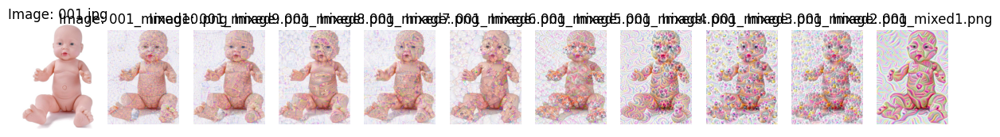

In [13]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define a list of image paths
image_paths = ['./images/001.jpg','./images/001_mixed10.png','./images/001_mixed9.png','./images/001_mixed8.png','./images/001_mixed7.png','./images/001_mixed6.png','./images/001_mixed5.png','./images/001_mixed4.png','./images/001_mixed3.png','./images/001_mixed2.png','./images/001_mixed1.png']

# Load the generated images and check them
images = []
for path in image_paths:
    try:
        img = Image.open(path)
        images.append(img)
        print(f"Image {path} loaded successfully: size={img.size}, mode={img.mode}")
    except Exception as e:
        print(f"Failed to load image {path}: {e}")

# If the image is loaded successfully, display the image
if len(images) == len(image_paths):
    fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
    for ax, img, path in zip(axes, images, image_paths):
        ax.imshow(img)
        ax.set_title(f"Image: {os.path.basename(path)}")
        ax.axis('off')

    plt.show()
else:
    print("Not all images were loaded successfully. Please check the image paths and files.")


### The following code comes from：https://huggingface.co/learn/cookbook/stable_diffusion_interpolation#example-3-interpolation-between-multiple-prompts

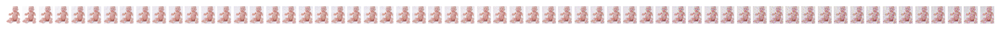

Interpolated images saved successfully.


In [29]:
# Adapted from chatgpt.
# Create a directory to save interpolated images
output_dir = 'interpolated_images'
os.makedirs(output_dir, exist_ok=True)

# Resize all images to the same size
# Define the target size (you can choose the smallest size as the target size)
target_size = (min(img.size[0] for img in images), min(img.size[1] for img in images))
images = [img.resize(target_size, Image.LANCZOS) for img in images]

# Convert images to NumPy arrays
image_arrays = [np.array(img) for img in images]

# Make sure all images are the same size
height, width, channels = image_arrays[0].shape

# Define the number of intermediate frames generated
num_interpolations = 6

# Initialise the array to store the interpolation results
interpolated_images = []

# Generate interpolated images
for i in range(len(images) - 1):
    for alpha in np.linspace(0, 1, num_interpolations):
        interpolated_image = (1 - alpha) * image_arrays[i] + alpha * image_arrays[i + 1]
        interpolated_image = interpolated_image.astype(np.uint8)
        interpolated_images.append(interpolated_image)

# Add the last image to the interpolation result
interpolated_images.append(image_arrays[-1])

# Display interpolation results
fig, axes = plt.subplots(1, len(interpolated_images), figsize=(20, 5))
for ax, img in zip(axes, interpolated_images):
    ax.imshow(img)
    ax.axis('off')

plt.show()

# Save interpolation results
for i, img in enumerate(interpolated_images):
    interpolated_image_pil = Image.fromarray(img)
    interpolated_image_pil.save(os.path.join(output_dir, f"interpolated_image_{i+1}.png"))

print("Interpolated images saved successfully.")

## Make animations with stable diffusion


The following code block will produce a 'zooming' animation, by feeding the outputs of the diffusion model back in as inputs. First run it and inspect the code to get a feel for how it works. 

Once you have ran the code once, can you modify the previous code block to do one of more of the following:



### Using FFMPEG

If you want to make the gif animation using this code notebook you will need to install [ffmpeg](https://ffmpeg.org/download.html). We have already installed ffmpeg in week 4, so you should already have it. But if you don't, then you can follow these instructions:

To install FFMPEG on Mac:
- Step 1: [install homebrew](https://brew.sh/)
- Step 2: Run `brew install ffmpeg`

To install FFMPEG on Windows:
- Follow [these instructions](https://phoenixnap.com/kb/ffmpeg-windows) for Windows installation

To install FFMPEG on Ubuntu linux:
- Step 1: Run `sudo apt update`
- Step 2: Run `sudo apt install ffmpeg`

If you cannot install FFMPEG you can [make a gif manually using this website](https://ezgif.com/maker).



Animate frames into a short gif using ffmpeg:

In [15]:
!ffmpeg -version

ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
built with Apple clang version 15.0.0 (clang-1500.3.9.4)
configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --enab

In [32]:
#!ffmpeg -y -f image2 -framerate 4 -i 'interpolated_images/frame_%02d.jpg' -loop 0 ai_animation.gif
#!ffmpeg -y -f image2 -framerate 4 -i 'interpolated_images/interpolated_image_%d.png' -loop 0 ai_animation.gif

ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --

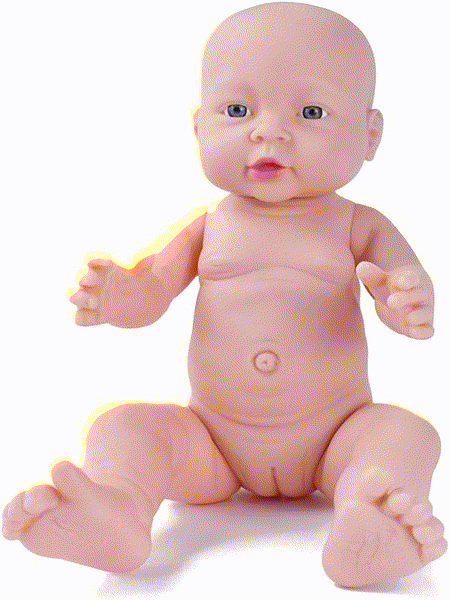

In [33]:
#IPython.display.Image('ai_animation.gif')

In [30]:
!ffmpeg -y -f image2 -framerate 4 -i 'interpolated_images/interpolated_image_%d.png' -vcodec libx264 -crf 23 -pix_fmt yuv420p ai_animation.mp4


ffmpeg version 7.0.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with Apple clang version 15.0.0 (clang-1500.3.9.4)
  configuration: --prefix=/opt/homebrew/Cellar/ffmpeg/7.0.1 --enable-shared --enable-pthreads --enable-version3 --cc=clang --host-cflags= --host-ldflags='-Wl,-ld_classic' --enable-ffplay --enable-gnutls --enable-gpl --enable-libaom --enable-libaribb24 --enable-libbluray --enable-libdav1d --enable-libharfbuzz --enable-libjxl --enable-libmp3lame --enable-libopus --enable-librav1e --enable-librist --enable-librubberband --enable-libsnappy --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtesseract --enable-libtheora --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lzma --enable-libfontconfig --enable-libfreetype --enable-frei0r --enable-libass --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libspeex --

In [31]:
from IPython.display import Video

# 显示视频
Video('ai_animation.mp4')